In [10]:
import torchvision
from torchvision import  transforms
import torch
from torch import no_grad
import requests
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [11]:
def get_predictions(pred, threshold=0.8, objects=None):
    """
    This function will assign a string name to a predicted class and eliminate predictions whose likelihood  is under a threshold 
    
    pred: a list where each element contains a tuple that corresponds to information about  the different objects; Each element includes a tuple with the class yhat, probability of belonging to that class and the coordinates of the bounding box corresponding to the object 
    image : frozen surface
    predicted_classes: a list where each element contains a tuple that corresponds to information about  the different objects; Each element includes a tuple with the class name, probability of belonging to that class and the coordinates of the bounding box corresponding to the object 
    thre
    """

    predicted_classes= [(COCO_INSTANCE_CATEGORY_NAMES[i],p,[(box[0], box[1]), (box[2], box[3])]) for i,p,box in zip(list(pred[0]['labels'].numpy()),pred[0]['scores'].detach().numpy(),list(pred[0]['boxes'].detach().numpy()))]
    predicted_classes=[  stuff  for stuff in predicted_classes  if stuff[1]>threshold ]

    if objects  and predicted_classes :
        predicted_classes=[ (name, p, box) for name, p, box in predicted_classes if name in  objects ]
    return predicted_classes

In [12]:
def draw_box(pred_class, img, rect_th=2, text_size=0.5, text_th=2, download_image=False, img_name="img"):
    """
    draws box around each object 
    
    predicted_classes: a list where each element contains a tuple that corresponds to information about the different objects; Each element includes a tuple with the class name, probability of belonging to that class and the coordinates of the bounding box corresponding to the object 
    image : frozen surface 
   
    """
    image = (np.clip(cv2.cvtColor(np.clip(img.numpy().transpose((1, 2, 0)), 0, 1), cv2.COLOR_RGB2BGR), 0, 1) * 255).astype(np.uint8).copy()

    for predicted_class in pred_class:

        label=predicted_class[0]
        probability=predicted_class[1]
        box=predicted_class[2]
        t = round(box[0][0].tolist())
        l = round(box[0][1].tolist())
        r = round(box[1][0].tolist())
        b = round(box[1][1].tolist())

        # Giving brief information about rectange, class and probability.
        from colorama import Fore
        from colorama import Style
        print(f"\nLabel: {Fore.GREEN}{label}{Style.RESET_ALL}")
        print(f"Box coordinates: {t}, {l}, {r}, {b}")
        print(f"Probability: {probability}")

        # Drawing rectangle and adding text on the picture based on their class and size.
        cv2.rectangle(image, (t, l), (r, b), (0, 255, 0), rect_th)
        cv2.rectangle(image, (t, l), (t+110, l+17), (255, 255, 255), -1)
        cv2.putText(image, label, (t+10, l+12),  cv2.FONT_HERSHEY_SIMPLEX,
                    text_size, (0,255,0), thickness=text_th)
        cv2.putText(image, label+": "+str(round(probability, 2)),
                    (t+10, l+12),  cv2.FONT_HERSHEY_SIMPLEX, text_size,
                    (0, 255, 0),thickness=text_th)

    # Plotting image
    image = np.array(image)
    plt.figure(figsize=(15, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    # if download_image:
    #     # plt.savefig(f'{img_name}.png')
    # else:
    #     pass
    plt.show()

    del(img)
    del(image)  

In [13]:
def save_RAM(image_=False):
    global image, img, pred
    torch.cuda.empty_cache()
    del(img)
    del(pred)
    if image_:
        image.close()
        del(image)

In [14]:
model_ = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model_.eval()

for name, param in model_.named_parameters():
    # freezing the part of the model as no changes happen to its parameters
    param.requires_grad = False
print("done")

/Users/ashleycui/miniconda3/envs/tf2/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/ashleycui/miniconda3/envs/tf2/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


done


In [15]:
def model(x):
    with torch.no_grad():
        yhat = model_(x)
    return yhat

In [16]:
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]
len(COCO_INSTANCE_CATEGORY_NAMES)

91

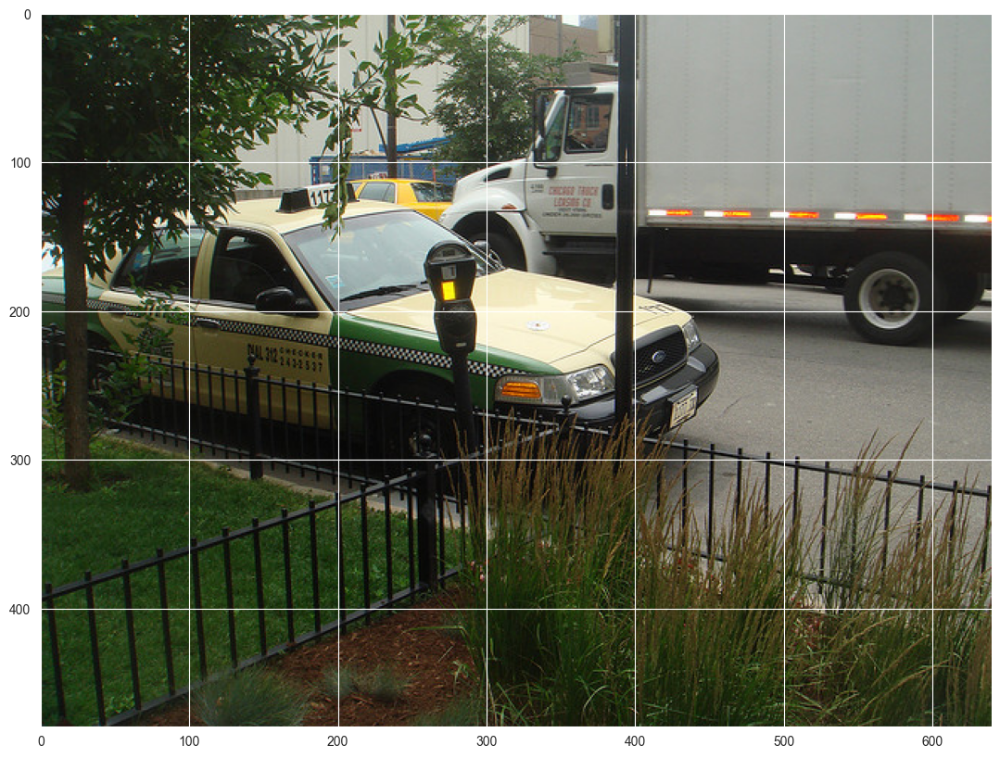

In [17]:
img_path='../trucktaxi.jpg'
half = 0.5
image = Image.open(img_path)

image.resize([int(half * s) for s in image.size] )
plt.figure(figsize=(15, 10))
plt.imshow(image)
plt.show()

In [18]:
transform = transforms.Compose([transforms.ToTensor()])
img = transform(image)
img

tensor([[[0.0706, 0.0745, 0.0863,  ..., 0.6078, 0.6157, 0.6157],
         [0.0824, 0.0706, 0.0745,  ..., 0.6078, 0.6157, 0.6157],
         [0.0784, 0.0667, 0.0588,  ..., 0.6039, 0.6078, 0.6157],
         ...,
         [0.0549, 0.1020, 0.1451,  ..., 0.1137, 0.1569, 0.1098],
         [0.0863, 0.0863, 0.1255,  ..., 0.1412, 0.1725, 0.1529],
         [0.2078, 0.1255, 0.1098,  ..., 0.1529, 0.1647, 0.1765]],

        [[0.0902, 0.0824, 0.0980,  ..., 0.6431, 0.6392, 0.6392],
         [0.1059, 0.0980, 0.0941,  ..., 0.6431, 0.6392, 0.6392],
         [0.1216, 0.1020, 0.0980,  ..., 0.6471, 0.6431, 0.6392],
         ...,
         [0.1961, 0.0941, 0.0980,  ..., 0.1529, 0.2078, 0.1608],
         [0.2275, 0.1647, 0.1490,  ..., 0.1765, 0.2118, 0.1922],
         [0.1843, 0.1843, 0.1922,  ..., 0.1882, 0.2000, 0.2118]],

        [[0.0667, 0.0627, 0.0706,  ..., 0.6314, 0.6392, 0.6392],
         [0.0902, 0.0706, 0.0667,  ..., 0.6314, 0.6314, 0.6392],
         [0.1059, 0.0824, 0.0667,  ..., 0.6314, 0.6314, 0.

In [19]:
pred = model([img])
len(pred[0]['labels'])

19

In [20]:
pred[0]['labels']

tensor([ 8, 14,  3,  3,  8,  3,  1,  3,  1,  8,  3,  8,  3,  8,  3,  8,  1,  3,
         3])

In [21]:
pred[0]['scores']

tensor([0.9970, 0.9890, 0.9464, 0.9453, 0.8627, 0.5151, 0.4550, 0.3830, 0.3228,
        0.3218, 0.2530, 0.2060, 0.1603, 0.0988, 0.0937, 0.0894, 0.0709, 0.0617,
        0.0555])

In [22]:
index=pred[0]['labels'][0].item()
COCO_INSTANCE_CATEGORY_NAMES[index]

'truck'

In [23]:
bounding_box=pred[0]['boxes'][0].tolist()
bounding_box

[269.799072265625, 8.69250202178955, 631.1013793945312, 229.5249481201172]

In [24]:
t, l, r, b = [round(x) for x in bounding_box]
print(t, l, r, b)

270 9 631 230


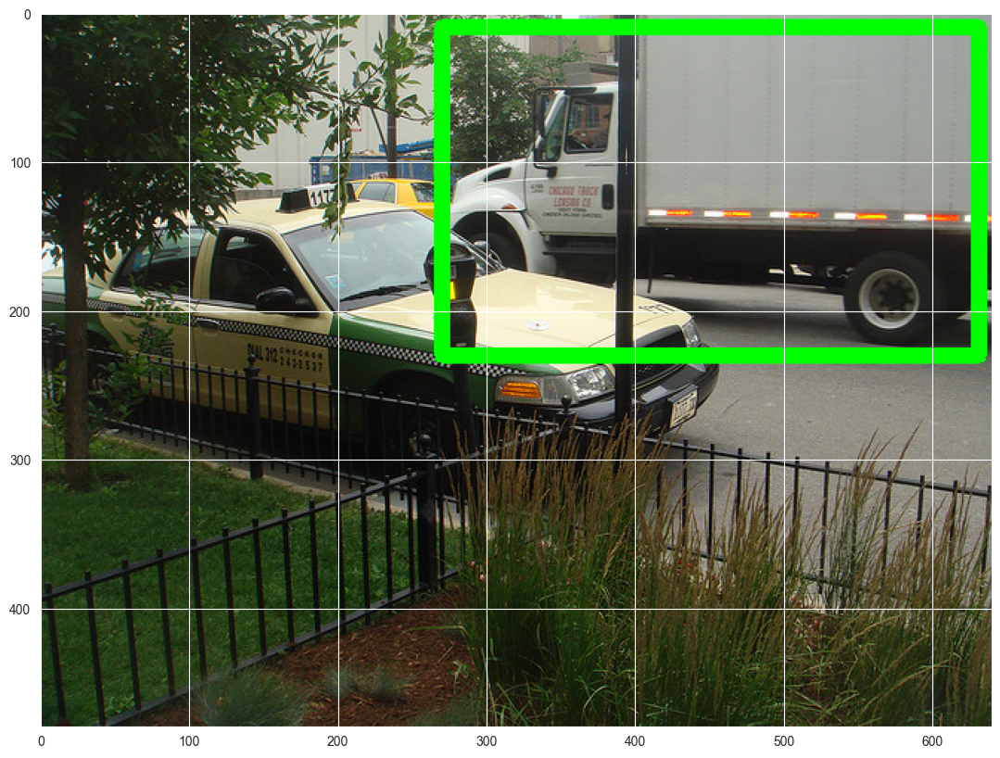

In [25]:
img_plot=(np.clip(cv2.cvtColor(np.clip(img.numpy().transpose((1, 2, 0)), 0, 1), cv2.COLOR_RGB2BGR), 0, 1) * 255).astype(np.uint8)
cv2.rectangle(img_plot, (t, l), (r, b), (0, 255, 0), 10) # Draw Rectangle with the coordinates
plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(img_plot, cv2.COLOR_BGR2RGB))
plt.show()
del img_plot, t, l, r, b


Label: car
Box coordinates: 204, 110, 278, 136
Probability: 0.946410059928894

Label: car
Box coordinates: 14, 128, 448, 305
Probability: 0.945306658744812


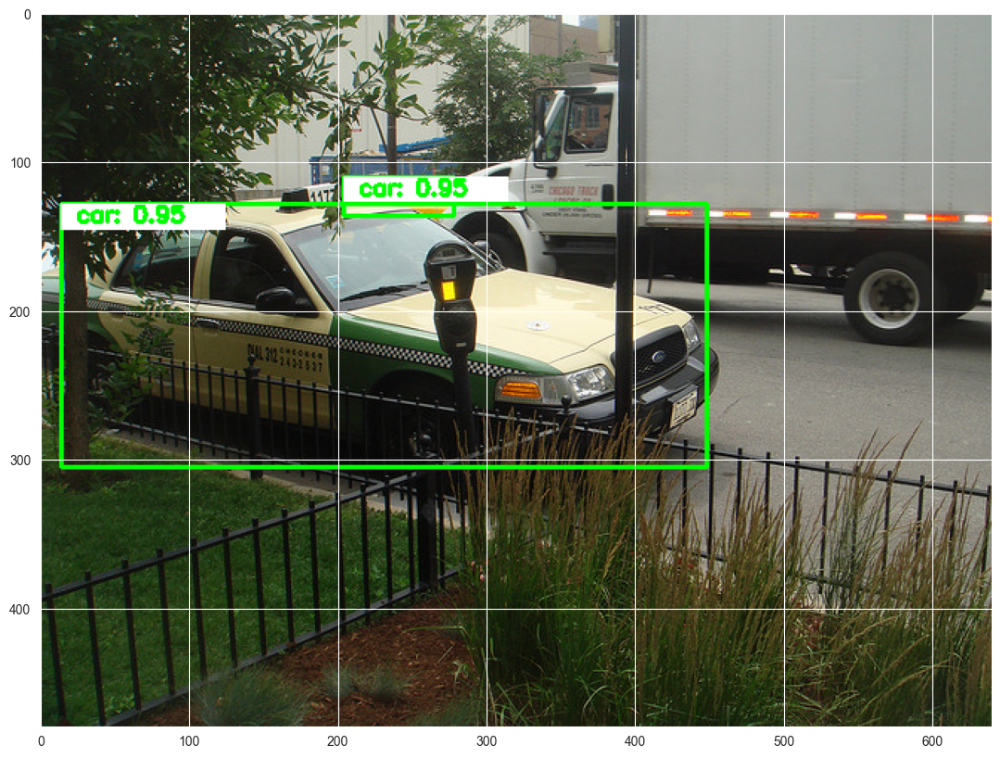

In [26]:
pred_class=get_predictions(pred, objects="car")
draw_box(pred_class, img)

del pred_class

In [27]:
get_predictions(pred, threshold=1, objects="truck")

[]


Label: truck
Box coordinates: 270, 9, 631, 230
Probability: 0.9970288872718811


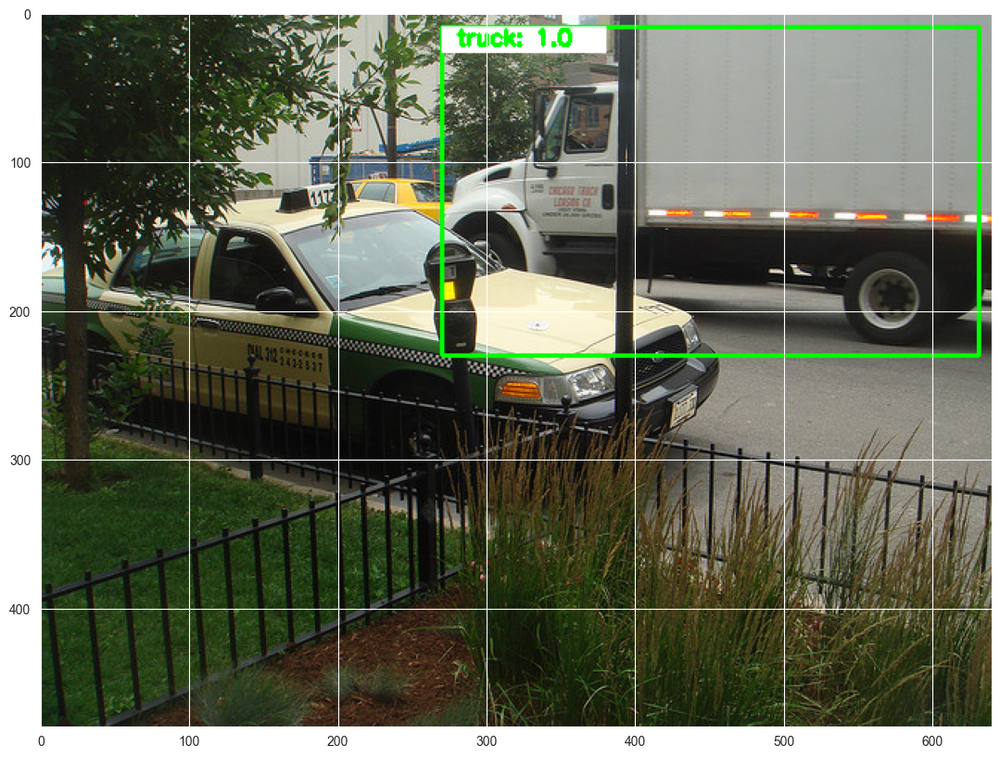

In [28]:
pred_thresh=get_predictions(pred, threshold=0.98, objects="truck")
draw_box(pred_thresh, img, download_image=True, img_name="truck_taxi")
del pred_thresh

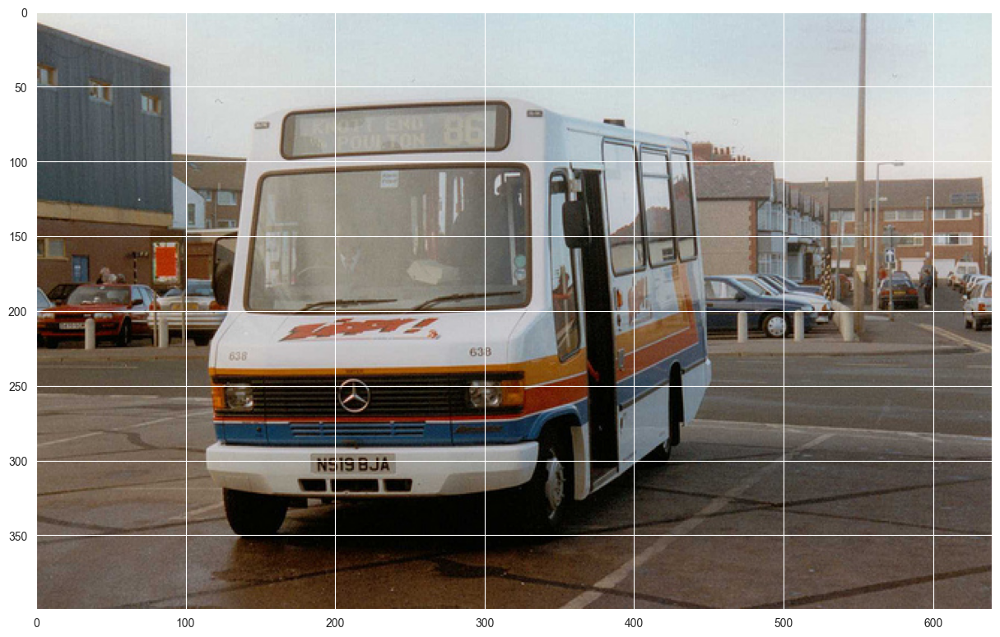

In [30]:
img_path='../bus.jpg'
image = Image.open(img_path)
image.resize([int(half * s) for s in image.size])
plt.figure(figsize=(15, 10))
plt.imshow(np.array(image))
plt.show()


Label: giraffe
Box coordinates: 319, 127, 446, 299
Probability: 0.99930739402771

Label: giraffe
Box coordinates: 78, 108, 277, 367
Probability: 0.9985185265541077

Label: person
Box coordinates: 1, 56, 70, 363
Probability: 0.997631311416626

Label: person
Box coordinates: 1, 210, 56, 371
Probability: 0.9287725687026978


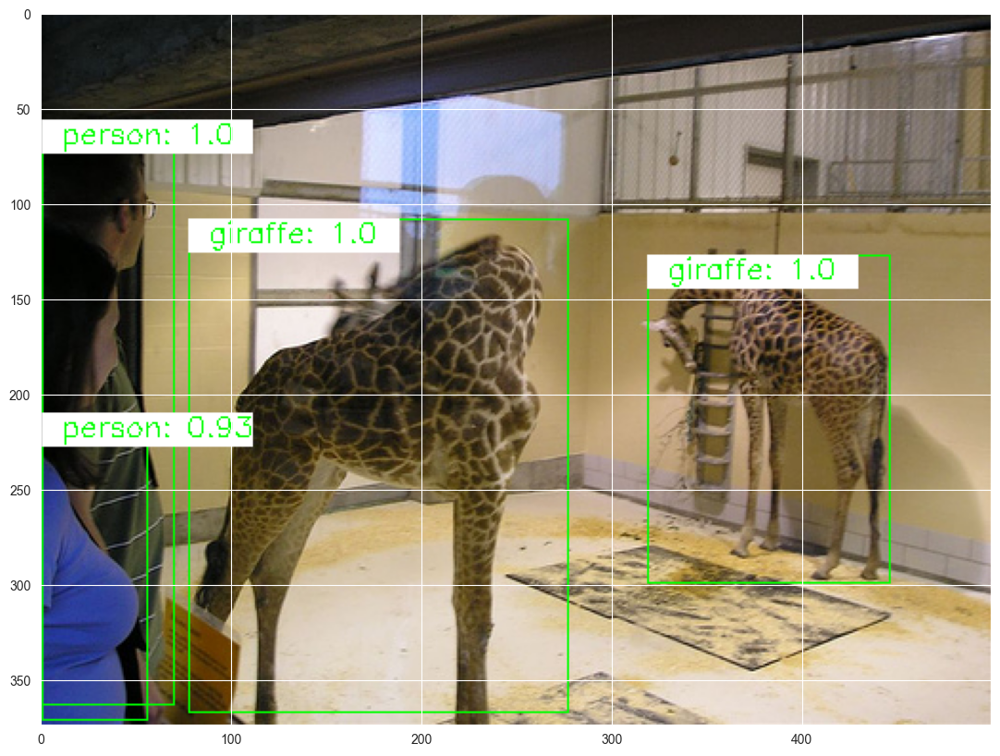

In [35]:
img_path='/Users/ashleycui/data/coco2014/val2014/COCO_val2014_000000000136.jpg'
image = Image.open(img_path)
image.resize([int(half * s) for s in image.size])

img = transform(image)
pred = model([img])
pred_thresh=get_predictions(pred, threshold=0.6)
draw_box(pred_thresh, img, rect_th=1, text_size= 0.5, text_th=1)

del pred_thresh

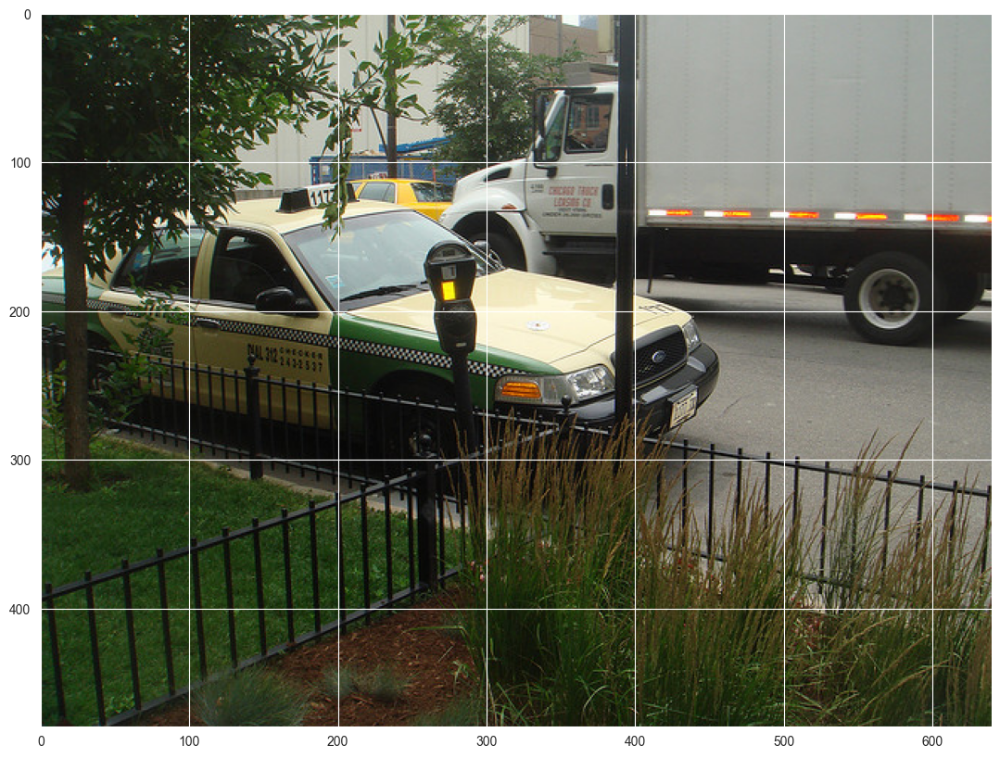

In [33]:
pred_obj=get_predictions(pred, objects="bus")
draw_box(pred_obj, img, rect_th=1,text_size= 0.5, text_th=1, download_image=True, img_name="busperson")

del pred_obj


Label: truck
Box coordinates: 270, 9, 631, 230
Probability: 0.9970288872718811

Label: parking meter
Box coordinates: 260, 156, 296, 232
Probability: 0.9890080690383911

Label: car
Box coordinates: 204, 110, 278, 136
Probability: 0.946410059928894

Label: car
Box coordinates: 14, 128, 448, 305
Probability: 0.945306658744812

Label: truck
Box coordinates: 270, 41, 401, 178
Probability: 0.8626700639724731

Label: car
Box coordinates: 201, 159, 463, 295
Probability: 0.5151335000991821

Label: person
Box coordinates: 355, 62, 383, 92
Probability: 0.4550120234489441

Label: car
Box coordinates: 9, 145, 103, 232
Probability: 0.38295048475265503

Label: person
Box coordinates: 355, 77, 375, 93
Probability: 0.3228458762168884

Label: truck
Box coordinates: 278, 34, 507, 183
Probability: 0.3218117356300354

Label: car
Box coordinates: 203, 111, 288, 157
Probability: 0.2529512643814087

Label: truck
Box coordinates: 6, 121, 380, 299
Probability: 0.2060340791940689

Label: car
Box coordinates: 1

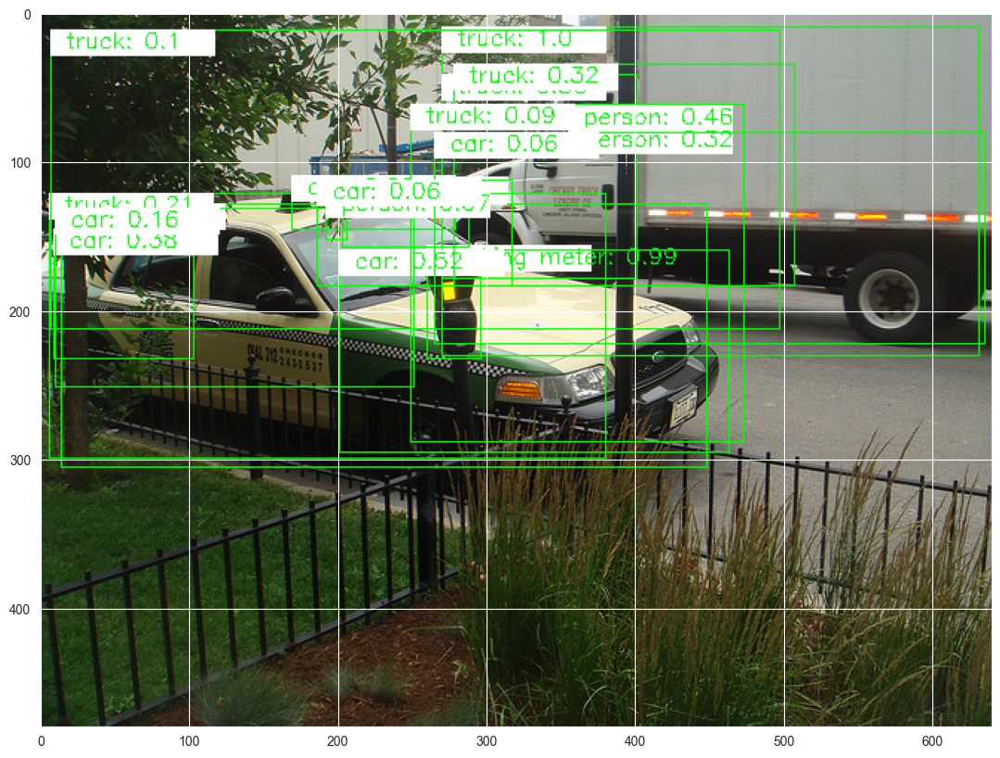

In [34]:
# if threshold is set too low, objects that are not there could be detected

pred_thresh=get_predictions(pred,threshold=0.01)
draw_box(pred_thresh, img, rect_th= 1, text_size=0.5, text_th=1)

del pred_thresh